# Uplift моделирование на данных компании MegaFon

Набор данных предоставлен компанией "МегаФон" в рамках соревнования [MegaFon Uplift Competition](https://ods.ai/competitions/megafon-df21-comp), проведенном в мае 2021 года.

**Описание данных**

* `id` (int): client id
* `treatment_group` (str): флаг treatment/control группы
* `X_1...X_50` (float): анонимированные признаки
* `conversion` (binary): target (целевой признак, факт совершения целевого действия)

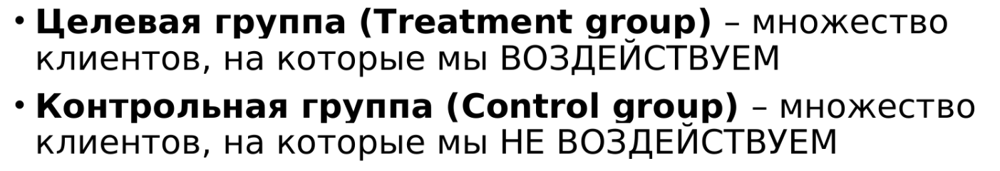![image.png](
  
)

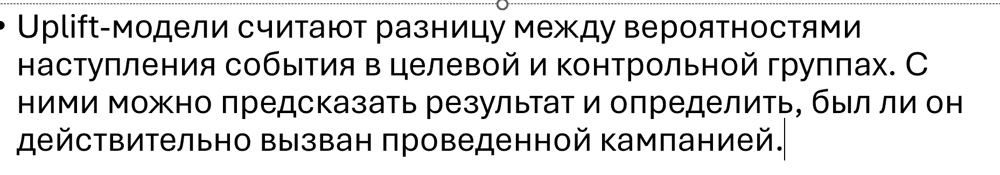

In [ ]:
import sys

# установим библиотеку uplift scikit-uplift и другие библиотеки
!pip install scikit-uplift dill lightgbm catboost

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.1/42.1 kB 1.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 119.4/119.4 kB 6.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.7/98.7 MB 6.3 MB/s eta 0:00:00


In [ ]:
import sklift
from sklift.datasets import fetch_megafon
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import warnings
%matplotlib inline

from sklearn.model_selection import train_test_split

from sklift.models import SoloModel
from sklift.models import TwoModels
from sklift.models import ClassTransformation
import lightgbm as lgb

from sklift.metrics import uplift_at_k, uplift_by_percentile, weighted_average_uplift, uplift_auc_score, qini_auc_score, average_squared_deviation


#from sklift.viz import plot_uplift_by_percentile
# from sklift.viz import plot_qini_curve, plot_uplift_curve
# from sklift.viz import plot_uplift_preds
from catboost import CatBoostClassifier


warnings.filterwarnings("ignore")
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', 20)

seed=42

/usr/local/lib/python3.10/dist-packages/dask/dataframe/__init__.py:42: FutureWarning: 
Dask dataframe query planning is disabled because dask-expr is not installed.

You can install it with `pip install dask[dataframe]` or `conda install dask`.
This will raise in a future version.

  warnings.warn(msg, FutureWarning)


## Загрузка данных и изучение данных

Датасет можно загрузить из модуля `sklift.datasets`, используя функцию `fetch_megafon`.

In [ ]:
# returns sklearn Bunch object
# with data, target, treatment keys
# data features (pd.DataFrame), target (pd.Series), treatment (pd.Series) values

df = fetch_megafon()

Megafon dataset:   0%|          | 0.00/276M [00:00<?, ?iB/s]

In [ ]:
print(f"Тип загруженных данных: {type(df)}\n")
print(f"Размерность датасета признаков features: {df['data'].shape}")
print(f"Размерность вектора target: {df['target'].shape}")
print(f"Размерность вектора treatment: {df['treatment'].shape}")

Тип загруженных данных: <class 'sklearn.utils._bunch.Bunch'>

Размерность датасета признаков features: (600000, 50)
Размерность вектора target: (600000,)
Размерность вектора treatment: (600000,)


Изучим набор признаков.

In [ ]:
# первые 5 строк
df['data'].head()

,X_1,X_2,X_3,X_4,X_5,X_6,X_7,X_8,X_9,X_10,X_11,X_12,X_13,X_14,X_15,X_16,X_17,X_18,X_19,X_20,X_21,X_22,X_23,X_24,X_25,X_26,X_27,X_28,X_29,X_30,X_31,X_32,X_33,X_34,X_35,X_36,X_37,X_38,X_39,X_40,X_41,X_42,X_43,X_44,X_45,X_46,X_47,X_48,X_49,X_50
0,39.396577,-0.186548,19.524505,21.250208,55.291264,182.966712,-5.385606,144.573379,-12.534344,-58.279429,283.544750,-3.297557,74.491728,11.674656,-4.852843,99.324038,159.686346,-5.830570,-4.554391,-75.704888,-4.540720,107.891557,-0.592276,0.513937,-3.415607,-7.454581,-38.519996,-116.186909,18.253466,0.775597,-66.833169,121.204278,-58.588803,0.266334,0.758562,-13.254177,200.715580,77.227063,-230.591020,-3.023398,90.877638,134.363458,-213.584582,-2.092461,-93.973258,-0.155597,-312.130733,44.798182,-125.682413,16.231365
1,38.987694,0.819522,-42.064512,-48.270949,-33.171257,179.459341,-87.151810,-162.693257,20.651652,181.635081,114.382486,10.277246,132.852421,-14.088731,82.011396,-19.290410,-155.851825,3.904401,26.194543,87.908221,115.714068,-179.564296,-1.202563,1.827663,87.042091,6.771393,12.481973,304.514135,3.618649,-0.422986,76.520982,67.402922,-407.896510,-1.269765,-34.027547,-91.572702,61.215866,-80.652713,-782.791784,-33.541388,-183.840746,72.864779,559.783584,1.142391,80.037124,-1.216185,-111.473936,-127.737977,-117.501171,10.732234
2,-16.693093,1.844558,-8.615192,-18.818740,-22.271188,-116.290369,-63.816746,-38.340763,24.968496,-136.340629,628.310139,-7.714403,-4.863992,-41.638770,187.244122,16.716381,103.805977,15.248096,-7.963610,-18.581579,247.603883,-60.794763,-0.707689,-0.293637,186.251855,4.644561,-13.456976,52.765776,-95.096983,-2.191094,41.936533,17.929746,-243.263646,7.630227,-27.235726,38.757461,168.534929,94.979240,-177.641632,-40.559792,-203.637766,2.480242,96.998504,1.100962,-33.275159,0.920926,-679.492242,-91.009397,-18.173358,14.367636
3,-72.040154,-0.226921,39.802607,16.441262,-1.112509,68.128008,23.073147,4.688858,-49.383641,-91.866107,374.208539,-5.197953,-16.972788,-20.513819,26.733826,-5.051170,266.620852,-1.003867,5.644895,101.563496,24.222458,15.445679,-0.193439,-0.537621,18.220545,-19.826745,-9.969067,-176.056848,-34.994979,-0.169379,20.194249,97.909989,41.396933,-4.572652,73.594603,59.882086,-18.703877,109.139592,-4.272029,18.375161,172.906875,83.951551,-323.642557,-0.369182,93.221948,-1.962380,-442.466684,-22.298302,-75.916603,11.634299
4,18.296973,0.996437,24.465307,-34.151971,24.623458,-155.455558,-12.159787,26.705778,105.864805,258.607252,-555.119130,14.632472,100.997894,-10.130204,52.278128,-6.223072,-91.566718,24.962987,16.902873,-125.359051,77.880711,65.763350,-0.250273,0.470302,58.583197,24.301061,7.895425,64.681136,0.208348,1.215403,-32.063615,1.182104,-15.530264,9.247841,-40.267539,27.330542,-78.737771,-79.762654,-101.123230,-30.324588,125.577535,-208.531112,118.902324,-0.808578,-117.497906,1.770635,627.395611,122.019189,194.091195,-11.883858


In [ ]:
df['data'].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 600000 entries, 0 to 599999
Data columns (total 50 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   X_1     600000 non-null  float64
 1   X_2     600000 non-null  float64
 2   X_3     600000 non-null  float64
 3   X_4     600000 non-null  float64
 4   X_5     600000 non-null  float64
 5   X_6     600000 non-null  float64
 6   X_7     600000 non-null  float64
 7   X_8     600000 non-null  float64
 8   X_9     600000 non-null  float64
 9   X_10    600000 non-null  float64
 10  X_11    600000 non-null  float64
 11  X_12    600000 non-null  float64
 12  X_13    600000 non-null  float64
 13  X_14    600000 non-null  float64
 14  X_15    600000 non-null  float64
 15  X_16    600000 non-null  float64
 16  X_17    600000 non-null  float64
 17  X_18    600000 non-null  float64
 18  X_19    600000 non-null  float64
 19  X_20    600000 non-null  float64
 20  X_21    600000 non-null  float64
 21  X_22    60

In [ ]:
# Оценим долю пропущенных значений
print('Доля NA:', df['data'].isna().sum().mean())

Доля NA: 0.0


In [ ]:
# Вычислим числовые характеристики признаков
df['data'].describe()

,X_1,X_2,X_3,X_4,X_5,X_6,X_7,X_8,X_9,X_10,X_11,X_12,X_13,X_14,X_15,X_16,X_17,X_18,X_19,X_20,X_21,X_22,X_23,X_24,X_25,X_26,X_27,X_28,X_29,X_30,X_31,X_32,X_33,X_34,X_35,X_36,X_37,X_38,X_39,X_40,X_41,X_42,X_43,X_44,X_45,X_46,X_47,X_48,X_49,X_50
count,600000.000000,600000.000000,600000.000000,600000.000000,600000.000000,600000.000000,600000.000000,600000.000000,600000.000000,600000.000000,600000.000000,600000.000000,600000.000000,600000.000000,600000.000000,600000.000000,600000.000000,600000.000000,600000.000000,600000.000000,600000.000000,600000.000000,600000.000000,600000.000000,600000.000000,600000.000000,600000.000000,600000.000000,600000.000000,600000.000000,600000.000000,600000.000000,600000.000000,600000.000000,600000.000000,600000.000000,600000.000000,600000.000000,600000.000000,600000.000000,600000.000000,600000.000000,600000.000000,600000.000000,600000.000000,600000.000000,600000.000000,600000.000000,600000.000000,600000.000000
mean,-3.758503,0.000405,0.356208,-1.004378,3.376919,-6.396371,-2.253712,-6.432606,-0.061507,-1.659301,19.093492,-0.093886,-0.002533,-2.463280,13.161988,7.063375,6.858253,-0.020896,-0.985809,-1.114770,14.835209,-9.909231,0.002470,-0.002707,11.159296,0.024798,-0.978981,4.599121,-6.263516,0.000554,2.704003,0.027546,-6.514740,-0.005655,3.002134,5.325791,7.739900,-4.721989,-9.206852,2.728692,6.882868,-6.632834,8.454493,0.001296,0.007967,-0.000966,-22.259600,-5.759041,6.241130,-1.176456
std,54.881882,0.999419,31.804123,45.291429,53.397644,140.873734,59.810396,74.840857,44.912292,199.625148,455.894665,11.295157,56.797326,39.922589,114.277207,77.628539,190.951808,11.476030,26.239683,72.371005,138.517373,160.879307,0.999777,1.000431,104.195126,28.332643,13.729246,142.981246,75.071084,1.000134,51.108902,107.851987,153.130771,6.964937,47.529482,70.700510,134.675174,131.789351,197.493595,39.501936,163.776538,137.025868,262.840194,1.000368,71.553713,0.999902,500.900364,130.952113,141.211999,21.363662
min,-271.659497,-4.372119,-148.870768,-244.446728,-302.574049,-683.126343,-322.731683,-506.202937,-218.466369,-920.347783,-2289.294108,-52.074964,-313.255431,-195.457350,-636.553079,-533.404670,-913.011610,-55.140610,-125.733156,-330.755792,-770.324798,-774.266979,-4.545333,-4.708793,-579.451426,-126.515623,-64.651485,-732.116727,-399.414460,-4.553086,-346.728398,-515.521884,-743.800243,-32.088261,-251.277376,-348.076864,-668.793144,-700.110808,-1016.301591,-179.589370,-810.842593,-633.575178,-1345.838757,-4.756720,-360.713742,-4.516004,-2506.960013,-687.526201,-702.184241,-98.094323
25%,-40.693313,-0.673108,-20.758308,-30.644608,-31.865404,-100.762161,-42.313674,-54.840796,-30.327330,-134.565241,-286.292508,-7.613948,-38.401625,-29.205585,-62.727814,-36.893267,-121.868113,-7.752689,-18.645383,-50.050451,-77.058591,-117.394644,-0.671963,-0.676781,-57.964784,-19.118055,-10.247693,-91.190920,-56.366783,-0.674265,-30.975631,-72.732677,-109.888686,-4.711524,-26.971012,-42.250017,-82.922581,-93.661192,-142.413854,-23.338528,-102.658380,-99.033996,-167.634846,-0.673780,-48.250836,-0.675549,-357.547278,-93.163915,-88.803657,-15.580688
50%,-3.954771,0.000915,0.372583,-0.585368,3.720738,-6.357443,-2.263690,-6.416419,-0.103742,-1.628897,17.651122,-0.092166,-0.011893,-2.438805,13.426780,6.988854,6.639970,-0.030727,-1.007271,-1.084433,15.207025,-9.837197,0.001802,-0.003722,11.438983,0.023834,-0.946478,4.772537,-6.364402,-0.000372,2.732262,0.114877,-6.661874,-0.000436,2.966662,5.500324,7.516796,-4.835168,-9.003721,2.779691,7.190600,-6.784760,8.773280,0.001639,0.045537,-0.002251,-20.695017,-5.774627,6.286783,-1.199895
75%,33.174835,0.673056,21.495530,29.027860,38.988940,88.159514,37.709780,41.962767,30.144501,130.948487,324.226048,7.409305,38.291691,24.248160,89.130548,50.993029,135.756702,7.731675,16.690977,47.694238,106.788310,97.891879,0.677217,0.671145,80.327985,19.116412,8.309784,100.845315,43.792144,0.675415,36.369149,72.890914,96.255945,4.690724,32.898811,52.905711,98.388563,84.208344,124.149483,28.739188,116.755600,85.6

###  Изучим баланс классов target и treatment

In [ ]:
df['treatment'].value_counts(normalize = True)

,proportion
treatment_group,
treatment,0.500613
control,0.499387


In [ ]:
df['treatment']

,treatment_group
0,control
1,control
2,treatment
3,treatment
4,treatment
...,...
599995,treatment
599996,treatment
599997,treatment
599998,treatment


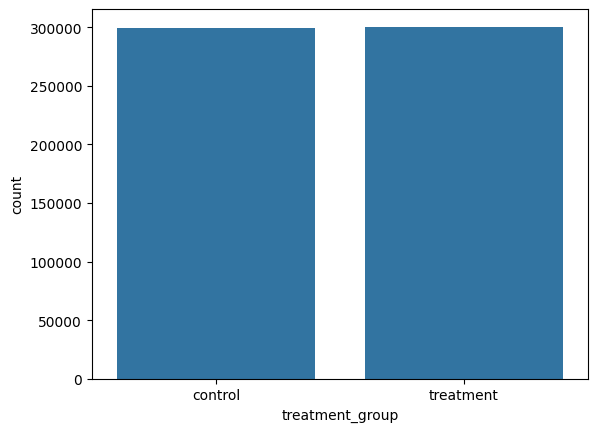

In [ ]:
sns.countplot(x=df['treatment'])
plt.show()

,proportion
conversion,
0,0.79581
1,0.20419


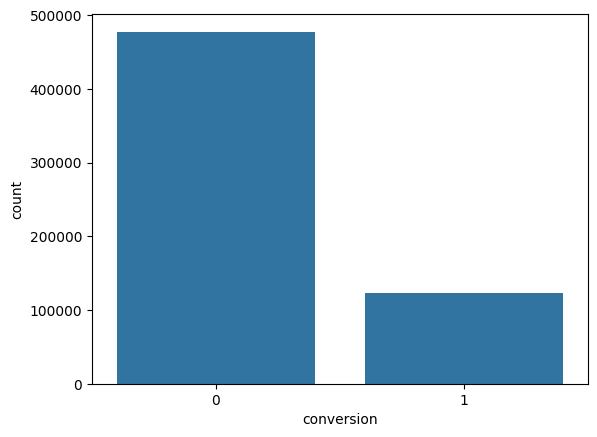

In [ ]:
display(df['target'].value_counts(normalize = True))
sns.countplot(x=df['target'])
plt.show()

Оценим долю конверсии в каждой группе (treatment/control)

In [ ]:
pd.crosstab(df['treatment'], df['target'], normalize='index')#.reset_index()

conversion,0,1
treatment_group,,
control,0.820600,0.179400
treatment,0.771081,0.228919


In [ ]:
df['target'].head(40)

,conversion
0,0
1,0
2,0
3,0
4,0
...,...
35,0
36,0
37,1
38,0


Видим дисбаланс в группах

### Подготовка данных для обучения моделей uplift

Преобразуем `treatment` в значения 0 и 1 в зависимости от того, в какую группу попал пользователь.

In [ ]:
df['treatment'].replace(['treatment', 'control'], [1, 0], inplace = True)
df['treatment'].value_counts()

,count
treatment_group,
1,300368
0,299632


В задаче бинарной классификации при дисбалансе классов мы используем стратифицированное разбиение данных по столбцу `target`. В задаче uplift дисбаланс должен быть учтен в каждой из групп (`treatment`, `control`). Поэтому сформируем столбец `stratify_cols` из двух столбцов: `treatment` и `target` и разделим данные на обучающую и валидационные выборки в пропорции 3:1.

In [ ]:
stratify_cols = pd.concat([df['treatment'], df['target']], axis=1)

X_train, X_val, treatment_train, treatment_val, y_train, y_val = train_test_split(
    df['data'],
    df['treatment'],
    df['target'],
    stratify=stratify_cols,
    test_size=0.25,
    random_state=seed
)

print(f"Размерность обучающего набора: {X_train.shape}")
print(f"Размерность валидационной выборки: {X_val.shape}")
print(f"Размерность валидационной выборки: {treatment_train.shape}")
print(f"Размерность валидационной выборки: {treatment_val.shape}")
print(f"Размерность валидационной выборки: {y_train.shape}")
print(f"Размерность валидационной выборки: {y_val.shape}")

Размерность обучающего набора: (450000, 50)
Размерность валидационной выборки: (150000, 50)
Размерность валидационной выборки: (450000,)
Размерность валидационной выборки: (150000,)
Размерность валидационной выборки: (450000,)
Размерность валидационной выборки: (150000,)


In [ ]:
treatment_val

,treatment_group
477778,0
189772,0
229840,0
176486,0
484351,1
...,...
179226,1
278750,0
251953,0
183919,0


In [ ]:
models_results = {
    'approach': [],
    'uplift@30%': []
}

## Построение моделей

### Одна модель с признаком коммуникации S-learner

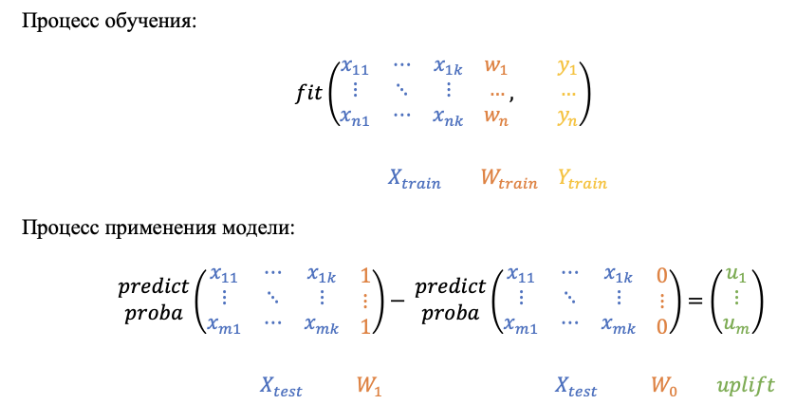

In [ ]:
s_model = SoloModel(CatBoostClassifier(verbose=100, thread_count = 1, random_state=seed))
s_model.fit(X_train, y_train, treatment_train, estimator_fit_params={'plot': True})
s_uplift = s_model.predict(X_val)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

Learning rate set to 0.139912
0:	learn: 0.6373829	total: 277ms	remaining: 4m 36s
100:	learn: 0.4208345	total: 19.6s	remaining: 2m 54s
200:	learn: 0.4023486	total: 40.7s	remaining: 2m 41s
300:	learn: 0.3925828	total: 1m	remaining: 2m 20s
400:	learn: 0.3863011	total: 1m 22s	remaining: 2m 3s
500:	learn: 0.3815924	total: 1m 42s	remaining: 1m 41s
600:	learn: 0.3771747	total: 2m 3s	remaining: 1m 21s
700:	learn: 0.3733110	total: 2m 22s	remaining: 1m
800:	learn: 0.3695500	total: 2m 43s	remaining: 40.6s
900:	learn: 0.3661920	total: 3m 2s	remaining: 20.1s
999:	learn: 0.3629414	total: 3m 23s	remaining: 0us


In [ ]:
s_uplift

array([ 0.01825976, -0.06528984,  0.10061042, ..., -0.00262508,
       -0.05334173, -0.06982601])

#### Метрики

Вычислим `uplift@k`

* strategy='overall' - сортирует по uplift в treatment и control группах вместе взятых
* strategy='by_group' - сортирует по uplift в treatment и control группах отдельно

In [ ]:
sm_score_by_group = uplift_at_k(y_true=y_val, uplift=s_uplift, treatment=treatment_val, strategy='by_group', k=0.3)
sm_score_overall = uplift_at_k(y_true=y_val, uplift=s_uplift, treatment=treatment_val, strategy='overall', k=0.3)
print(f'uplift@30% by group {sm_score_by_group}')
print(f'uplift@30% overall {sm_score_overall}')
models_results['approach'].append('SoloModel')
models_results['uplift@30%'].append(sm_score_by_group)



uplift@30% by group 0.2218854166266648
uplift@30% overall 0.22217581469797673


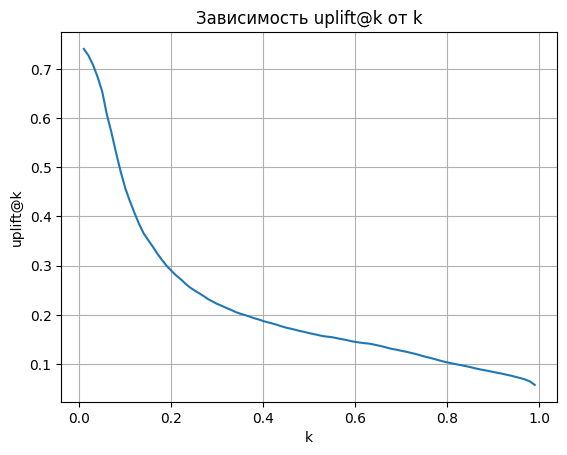

In [ ]:
values_uplift_k_solo = []
values_k = []
for k in np.arange(0.01,1,0.01):
  values_uplift_k_solo.append(uplift_at_k(y_val, s_uplift, treatment_val, strategy='overall', k=k))
  values_k.append(k)

plt.plot(values_k, values_uplift_k_solo)
plt.title('Зависимость uplift@k от k')
plt.xlabel('k')
plt.ylabel('uplift@k')
plt.grid()
plt.show()

In [ ]:
# weighted average uplift
uplift_full_data = weighted_average_uplift(y_val, s_uplift, treatment_val, bins=10)
print(f"average uplift на всей валидации: {uplift_full_data:.4f}")

average uplift на всей валидации: 0.0496


In [ ]:
# Получим условные вероятности выполнения целевого действия при взаимодействии для каждого объекта
sm_trmnt_preds = s_model.trmnt_preds_
# И условные вероятности выполнения целевого действия без взаимодействия для каждого объекта
sm_ctrl_preds = s_model.ctrl_preds_

# Отрисуем распределения вероятностей и их разность (uplift)
#sklift.viz.plot_uplift_preds(trmnt_preds=sm_trmnt_preds, ctrl_preds=sm_ctrl_preds);

In [ ]:
# AUQC = area under Qini curve = Qini coefficient
auqc = qini_auc_score(y_val, s_uplift, treatment_val)
print(f"Qini coefficient на валидационной выборке: {auqc:.4f}")

Qini coefficient на валидационной выборке: 0.2474


In [ ]:
# AUUC = area under Uplift curve
auuc = uplift_auc_score(y_val, s_uplift, treatment_val)
print(f"Uplift coefficient на валидационной выборке: {auuc:.4f}")

Uplift coefficient на валидационной выборке: 0.1705


In [ ]:
# uplift_by_percentile
uplift_by_percentile(y_val, s_uplift, treatment_val,
                     strategy='overall',
                     total=False, std=True, bins=10)

,n_treatment,n_control,response_rate_treatment,response_rate_control,uplift,std_treatment,std_control,std_uplift
percentile,,,,,,,,
0-10,7438,7562,0.599892,0.142158,0.457734,0.005681,0.004016,0.006957
10-20,7556,7444,0.266146,0.141188,0.124959,0.005084,0.004036,0.006491
20-30,7480,7520,0.216979,0.130851,0.086128,0.004766,0.003889,0.006151
30-40,7476,7524,0.218165,0.135167,0.082997,0.004777,0.003942,0.006193
40-50,7549,7451,0.207047,0.141860,0.065187,0.004664,0.004042,0.006171
50-60,7625,7375,0.205770,0.148068,0.057703,0.004630,0.004136,0.006208
60-70,7515,7485,0.219428,0.200401,0.019027,0.004774,0.004627,0.006648
70-80,7521,7479,0.140008,0.202166,-0.062158,0.004001,0.004644,0.006130
80-90,7431,7569,0.087875,0.161712,-0.073837,0.003284,0.004232,0.005357


Визуализируем результаты таблицы uplift_by_percentile

In [ ]:
# line plot
#plot_uplift_by_percentile(y_val, s_uplift, treatment_val, strategy='overall', kind='line');

# bar plot
#plot_uplift_by_percentile(y_val, s_uplift, treatment_val, strategy='overall', kind='bar');

In [ ]:
# with ideal Qini curve (red line)
# perfect=True

#fig, ax_roc = plt.subplots(1, 1)
#plot_qini_curve(y_val, s_uplift, treatment_val, name='Solo model', random=True, perfect=True, ax=ax_roc);

## Трансформация классов

In [ ]:
ct_model = ClassTransformation(CatBoostClassifier(verbose =100, thread_count=1, random_state=seed))
ct_model = ct_model.fit(X_train, y_train, treatment_train, estimator_fit_params={'plot': True})

uplift_ct = ct_model.predict(X_val)
print(uplift_ct)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

Learning rate set to 0.139912
0:	learn: 0.6922018	total: 176ms	remaining: 2m 55s
100:	learn: 0.6759569	total: 20.2s	remaining: 2m 59s
200:	learn: 0.6710756	total: 39s	remaining: 2m 35s
300:	learn: 0.6671310	total: 1m 1s	remaining: 2m 21s
400:	learn: 0.6634656	total: 1m 19s	remaining: 1m 59s
500:	learn: 0.6599301	total: 1m 39s	remaining: 1m 39s
600:	learn: 0.6564961	total: 1m 59s	remaining: 1m 19s
700:	learn: 0.6531885	total: 2m 18s	remaining: 59s
800:	learn: 0.6500081	total: 2m 38s	remaining: 39.5s
900:	learn: 0.6469056	total: 2m 58s	remaining: 19.6s
999:	learn: 0.6438840	total: 3m 18s	remaining: 0us
[ 0.10417672 -0.08407998  0.21089939 ...  0.02061939 -0.03282294
 -0.04999029]


### Метрики

In [ ]:
ct_score_by_group = uplift_at_k(y_true=y_val, uplift=uplift_ct, treatment=treatment_val, strategy='by_group', k=0.3)
ct_score_overall = uplift_at_k(y_true=y_val, uplift=uplift_ct, treatment=treatment_val, strategy='overall', k=0.3)
print(f'uplift@30% by group {ct_score_by_group}')
print(f'uplift@30% overall {ct_score_overall}')
models_results['approach'].append('ClassTransformationModel')
models_results['uplift@30%'].append(ct_score_by_group)



uplift@30% by group 0.20858599086578483
uplift@30% overall 0.20946439394764996


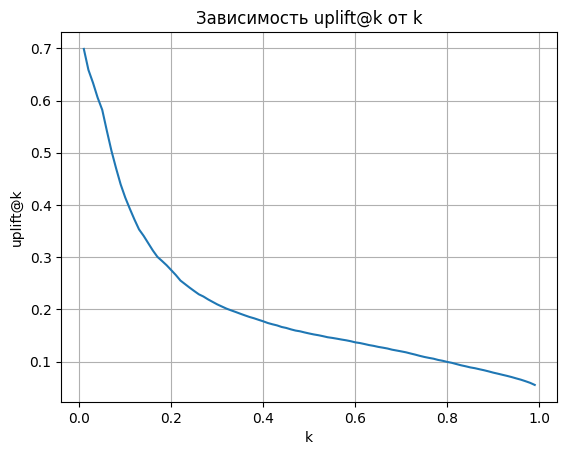

In [ ]:
values_uplift_k_class_transform = []
values_k = []
for k in np.arange(0.01,1,0.01):
  values_uplift_k_class_transform.append(uplift_at_k(y_val, uplift_ct, treatment_val, strategy='overall', k=k))
  values_k.append(k)

plt.plot(values_k, values_uplift_k_class_transform)
plt.title('Зависимость uplift@k от k')
plt.xlabel('k')
plt.ylabel('uplift@k')
plt.grid()
plt.show()

In [ ]:
# weighted average uplift
uplift_full_data = weighted_average_uplift(y_val, uplift_ct, treatment_val, bins=10)
print(f"average uplift на всей валидации: {uplift_full_data:.4f}")

average uplift на всей валидации: 0.0492


In [ ]:
# AUQC = area under Qini curve = Qini coefficient
auqc = qini_auc_score(y_val, uplift_ct, treatment_val)
print(f"Qini coefficient на валидационной выборке: {auqc:.4f}")

Qini coefficient на валидационной выборке: 0.2230


In [ ]:
# AUUC = area under Uplift curve
auuc = uplift_auc_score(y_val, uplift_ct, treatment_val)
print(f"Uplift coefficient на валидационной выборке: {auuc:.4f}")

Uplift coefficient на валидационной выборке: 0.1542


In [ ]:
# uplift_by_percentile
uplift_by_percentile(y_val, uplift_ct, treatment_val,
                     strategy='overall',
                     total=False, std=True, bins=10)

,n_treatment,n_control,response_rate_treatment,response_rate_control,uplift,std_treatment,std_control,std_uplift
percentile,,,,,,,,
0-10,7448,7552,0.547798,0.133607,0.414191,0.005767,0.003915,0.006970
10-20,7500,7500,0.258667,0.121600,0.137067,0.005056,0.003774,0.006309
20-30,7465,7535,0.214601,0.136563,0.078039,0.004752,0.003956,0.006183
30-40,7485,7515,0.212826,0.133067,0.079758,0.004731,0.003918,0.006143
40-50,7609,7391,0.198581,0.136653,0.061928,0.004573,0.003995,0.006073
50-60,7532,7468,0.202868,0.150777,0.052091,0.004634,0.004141,0.006214
60-70,7550,7450,0.192053,0.176510,0.015543,0.004533,0.004417,0.006330
70-80,7474,7526,0.165239,0.207547,-0.042308,0.004296,0.004675,0.006349
80-90,7455,7545,0.133467,0.219351,-0.085883,0.003939,0.004764,0.006181


## Две независимые модели

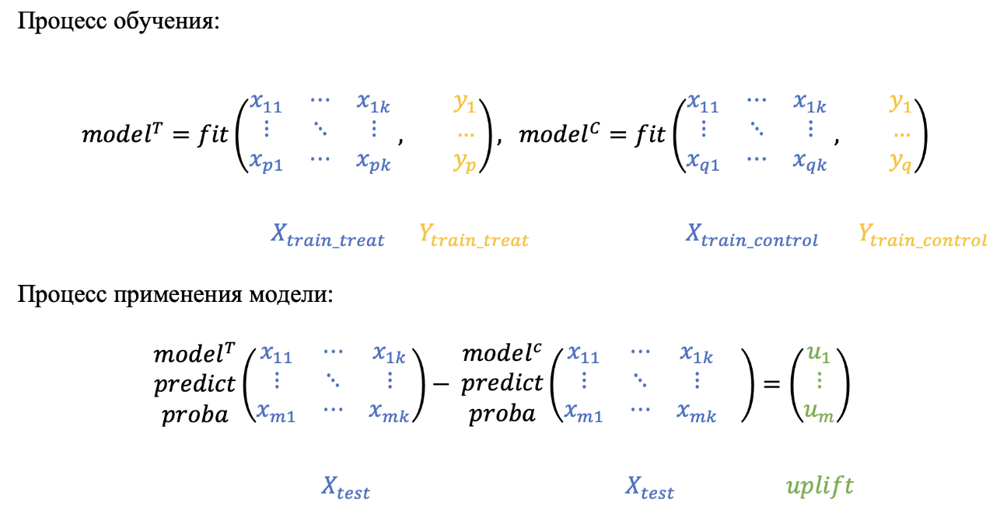

In [ ]:
two_models = TwoModels(
    estimator_trmnt=CatBoostClassifier(verbose = 100, thread_count=1, random_state=seed),
    estimator_ctrl=CatBoostClassifier(verbose = 100, thread_count=1, random_state=seed),
    method='vanilla'
)
two_models = two_models.fit(
    X_train, y_train, treatment_train,
    estimator_trmnt_fit_params={'plot': True},
    estimator_ctrl_fit_params={'plot': True}
)

uplift_two_m = two_models.predict(X_val)


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

Learning rate set to 0.104013
0:	learn: 0.6437232	total: 112ms	remaining: 1m 51s
100:	learn: 0.3804922	total: 11.2s	remaining: 1m 39s
200:	learn: 0.3660646	total: 22.5s	remaining: 1m 29s
300:	learn: 0.3580433	total: 33.5s	remaining: 1m 17s
400:	learn: 0.3517370	total: 44.1s	remaining: 1m 5s
500:	learn: 0.3464914	total: 54.4s	remaining: 54.2s
600:	learn: 0.3415263	total: 1m 5s	remaining: 43.6s
700:	learn: 0.3366957	total: 1m 16s	remaining: 32.7s
800:	learn: 0.3319615	total: 1m 28s	remaining: 21.9s
900:	learn: 0.3273331	total: 1m 39s	remaining: 10.9s
999:	learn: 0.3230957	total: 1m 49s	remaining: 0us


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

Learning rate set to 0.104122
0:	learn: 0.6561785	total: 158ms	remaining: 2m 37s
100:	learn: 0.4466364	total: 10.5s	remaining: 1m 33s
200:	learn: 0.4222521	total: 22s	remaining: 1m 27s
300:	learn: 0.4108512	total: 33.6s	remaining: 1m 18s
400:	learn: 0.4036893	total: 45s	remaining: 1m 7s
500:	learn: 0.3974726	total: 56.4s	remaining: 56.2s
600:	learn: 0.3919800	total: 1m 6s	remaining: 44.4s
700:	learn: 0.3866311	total: 1m 17s	remaining: 33.2s
800:	learn: 0.3816084	total: 1m 29s	remaining: 22.2s
900:	learn: 0.3767400	total: 1m 40s	remaining: 11.1s
999:	learn: 0.3721422	total: 1m 52s	remaining: 0us


#### Метрики

Вычислим `uplift@k`

* strategy='overall' - сортирует по uplift в treatment и control группах вместе взятых
* strategy='by_group' - сортирует по uplift в treatment и control группах отдельно

In [ ]:
tm_score_by_group = uplift_at_k(y_true=y_val, uplift=uplift_two_m, treatment=treatment_val, strategy='by_group', k=0.3)
tm_score_overall = uplift_at_k(y_true=y_val, uplift=uplift_two_m, treatment=treatment_val, strategy='overall', k=0.3)
print(f'uplift@30% by group {tm_score_by_group}')
print(f'uplift@30% overall {tm_score_overall}')
models_results['approach'].append('TwoModels')
models_results['uplift@30%'].append(tm_score_by_group)



uplift@30% by group 0.22449900039259874
uplift@30% overall 0.2253258154992513


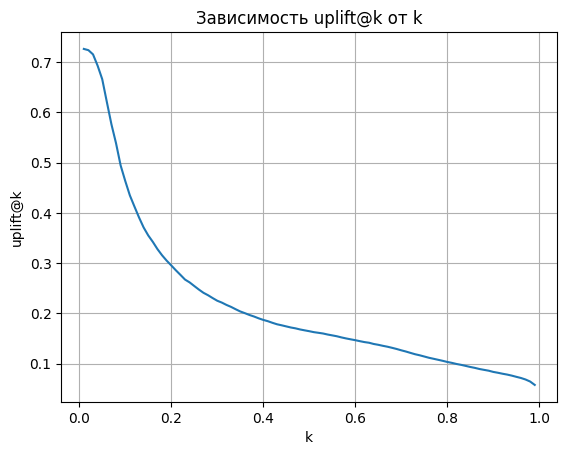

In [ ]:
values_uplift_k_two_m = []
values_k = []
for k in np.arange(0.01,1,0.01):
  values_uplift_k_two_m.append(uplift_at_k(y_val, uplift_two_m, treatment_val, strategy='overall', k=k))
  values_k.append(k)

plt.plot(values_k, values_uplift_k_two_m)
plt.title('Зависимость uplift@k от k')
plt.xlabel('k')
plt.ylabel('uplift@k')
plt.grid()
plt.show()

In [ ]:
# weighted average uplift
uplift_full_data = weighted_average_uplift(y_val, uplift_two_m, treatment_val, bins=10)
print(f"average uplift на всей валидации: {uplift_full_data:.4f}")

average uplift на всей валидации: 0.0495


In [ ]:
# Получим условные вероятности выполнения целевого действия при взаимодействии для каждого объекта
tm_trmnt_preds = two_models.trmnt_preds_
# И условные вероятности выполнения целевого действия без взаимодействия для каждого объекта
tm_ctrl_preds = two_models.ctrl_preds_

# Отрисуем распределения вероятностей и их разность (uplift)
#sklift.viz.plot_uplift_preds(trmnt_preds=tm_trmnt_preds, ctrl_preds=tm_ctrl_preds);

In [ ]:
# AUQC = area under Qini curve = Qini coefficient
auqc = qini_auc_score(y_val, uplift_two_m, treatment_val)
print(f"Qini coefficient на валидационной выборке: {auqc:.4f}")

Qini coefficient на валидационной выборке: 0.2486


In [ ]:
# AUUC = area under Uplift curve
auuc = uplift_auc_score(y_val, uplift_two_m, treatment_val)
print(f"Uplift coefficient на валидационной выборке: {auuc:.4f}")

Uplift coefficient на валидационной выборке: 0.1718


In [ ]:
# uplift_by_percentile
uplift_by_percentile(y_val, uplift_two_m, treatment_val,
                     strategy='overall',
                     total=False, std=True, bins=10)

,n_treatment,n_control,response_rate_treatment,response_rate_control,uplift,std_treatment,std_control,std_uplift
percentile,,,,,,,,
0-10,7452,7548,0.592324,0.128643,0.463681,0.005692,0.003854,0.006874
10-20,7418,7582,0.246967,0.120153,0.126814,0.005007,0.003734,0.006246
20-30,7560,7440,0.203836,0.116667,0.087169,0.004633,0.003722,0.005943
30-40,7439,7561,0.196801,0.124587,0.072214,0.004610,0.003798,0.005973
40-50,7625,7375,0.198820,0.122169,0.076650,0.004571,0.003813,0.005952
50-60,7607,7393,0.194952,0.136616,0.058336,0.004542,0.003994,0.006049
60-70,7487,7513,0.167757,0.162252,0.005505,0.004318,0.004253,0.006061
70-80,7468,7532,0.099625,0.158922,-0.059297,0.003466,0.004213,0.005455
80-90,7521,7479,0.113017,0.187859,-0.074842,0.003651,0.004517,0.005808


## Две зависимые модели

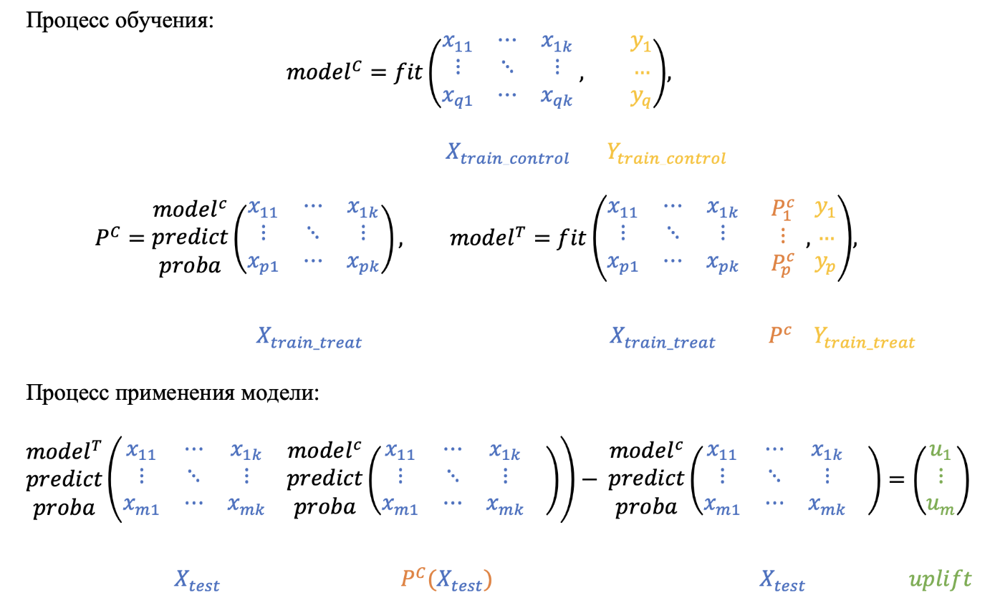

In [ ]:
two_models_ctrl = TwoModels(
    estimator_trmnt=CatBoostClassifier(verbose = 100, thread_count=1, random_state=seed),
    estimator_ctrl=CatBoostClassifier(verbose = 100, thread_count=1, random_state=seed),
    method='ddr_control'
)
two_models_ctrl = two_models_ctrl.fit(
    X_train, y_train, treatment_train,
    estimator_trmnt_fit_params={'plot': True},
    estimator_ctrl_fit_params={'plot': True}
)

uplift_tm_ctrl = two_models_ctrl.predict(X_val)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

Learning rate set to 0.104013
0:	learn: 0.6437232	total: 104ms	remaining: 1m 43s
100:	learn: 0.3804922	total: 11.5s	remaining: 1m 42s
200:	learn: 0.3660646	total: 22.9s	remaining: 1m 31s
300:	learn: 0.3580433	total: 34.1s	remaining: 1m 19s
400:	learn: 0.3517370	total: 45.4s	remaining: 1m 7s
500:	learn: 0.3464914	total: 56s	remaining: 55.7s
600:	learn: 0.3415263	total: 1m 6s	remaining: 44.3s
700:	learn: 0.3366957	total: 1m 17s	remaining: 33.2s
800:	learn: 0.3319615	total: 1m 29s	remaining: 22.2s
900:	learn: 0.3273331	total: 1m 40s	remaining: 11.1s
999:	learn: 0.3230957	total: 1m 52s	remaining: 0us


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

Learning rate set to 0.104122
0:	learn: 0.6494859	total: 123ms	remaining: 2m 2s
100:	learn: 0.4155441	total: 11.5s	remaining: 1m 42s
200:	learn: 0.4022737	total: 22.2s	remaining: 1m 28s
300:	learn: 0.3952340	total: 33s	remaining: 1m 16s
400:	learn: 0.3893555	total: 44.3s	remaining: 1m 6s
500:	learn: 0.3838497	total: 55.7s	remaining: 55.4s
600:	learn: 0.3787072	total: 1m 7s	remaining: 44.5s
700:	learn: 0.3738254	total: 1m 18s	remaining: 33.5s
800:	learn: 0.3691143	total: 1m 29s	remaining: 22.2s
900:	learn: 0.3646251	total: 1m 40s	remaining: 11s
999:	learn: 0.3601944	total: 1m 51s	remaining: 0us


In [ ]:
two_models_trtmt = TwoModels(
    estimator_trmnt=CatBoostClassifier(verbose = 100, thread_count=1, random_state=seed),
    estimator_ctrl=CatBoostClassifier(verbose = 100, thread_count=1, random_state=seed),
    method='ddr_treatment'
)
two_models_trtmt = two_models_trtmt.fit(
    X_train, y_train, treatment_train,
    estimator_trmnt_fit_params={'plot': True},
    estimator_ctrl_fit_params={'plot': True}
)

uplift_tm_trtmt = two_models_trtmt.predict(X_val)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

Learning rate set to 0.104122
0:	learn: 0.6561785	total: 95ms	remaining: 1m 34s
100:	learn: 0.4466364	total: 13s	remaining: 1m 56s
200:	learn: 0.4222521	total: 24.5s	remaining: 1m 37s
300:	learn: 0.4108512	total: 36s	remaining: 1m 23s
400:	learn: 0.4036893	total: 47.3s	remaining: 1m 10s
500:	learn: 0.3974726	total: 58.5s	remaining: 58.3s
600:	learn: 0.3919800	total: 1m 8s	remaining: 45.6s
700:	learn: 0.3866311	total: 1m 19s	remaining: 34.1s
800:	learn: 0.3816084	total: 1m 31s	remaining: 22.7s
900:	learn: 0.3767400	total: 1m 42s	remaining: 11.3s
999:	learn: 0.3721422	total: 1m 54s	remaining: 0us


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

Learning rate set to 0.104013
0:	learn: 0.6360894	total: 126ms	remaining: 2m 6s
100:	learn: 0.3822491	total: 11.4s	remaining: 1m 41s
200:	learn: 0.3671841	total: 22.8s	remaining: 1m 30s
300:	learn: 0.3584551	total: 33.1s	remaining: 1m 16s
400:	learn: 0.3521176	total: 44.1s	remaining: 1m 5s
500:	learn: 0.3463385	total: 55.4s	remaining: 55.2s
600:	learn: 0.3413636	total: 1m 6s	remaining: 44.3s
700:	learn: 0.3365992	total: 1m 18s	remaining: 33.3s
800:	learn: 0.3319731	total: 1m 29s	remaining: 22.2s
900:	learn: 0.3276160	total: 1m 39s	remaining: 10.9s
999:	learn: 0.3233643	total: 1m 50s	remaining: 0us


#### Метрики

Вычислим `uplift@k`

* strategy='overall' - сортирует по uplift в treatment и control группах вместе взятых
* strategy='by_group' - сортирует по uplift в treatment и control группах отдельно

In [ ]:
tm_score_by_group = uplift_at_k(y_true=y_val, uplift=uplift_tm_ctrl, treatment=treatment_val, strategy='by_group', k=0.3)
tm_score_overall = uplift_at_k(y_true=y_val, uplift=uplift_tm_ctrl, treatment=treatment_val, strategy='overall', k=0.3)
print(f'uplift@30% by group {tm_score_by_group}')
print(f'uplift@30% overall {tm_score_overall}')
models_results['approach'].append('TwoModels_ddr_control')
models_results['uplift@30%'].append(tm_score_by_group)



uplift@30% by group 0.2135086486066805
uplift@30% overall 0.21489140220147085


In [ ]:
tm_score_by_group = uplift_at_k(y_true=y_val, uplift=uplift_tm_trtmt, treatment=treatment_val, strategy='by_group', k=0.3)
tm_score_overall = uplift_at_k(y_true=y_val, uplift=uplift_tm_trtmt, treatment=treatment_val, strategy='overall', k=0.3)
print(f'uplift@30% by group {tm_score_by_group}')
print(f'uplift@30% overall {tm_score_overall}')
models_results['approach'].append('TwoModels_ddr_treatment')
models_results['uplift@30%'].append(tm_score_by_group)

uplift@30% by group 0.22371071529164407
uplift@30% overall 0.22424723939214902


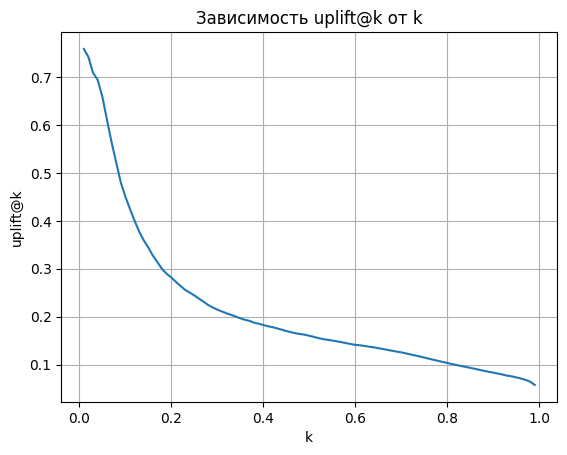

In [ ]:
values_uplift_k_two_m_ctrl = []
values_k = []
for k in np.arange(0.01,1,0.01):
  values_uplift_k_two_m_ctrl.append(uplift_at_k(y_val, uplift_tm_ctrl, treatment_val, strategy='overall', k=k))
  values_k.append(k)

plt.plot(values_k, values_uplift_k_two_m_ctrl)
plt.title('Зависимость uplift@k от k')
plt.xlabel('k')
plt.ylabel('uplift@k')
plt.grid()
plt.show()

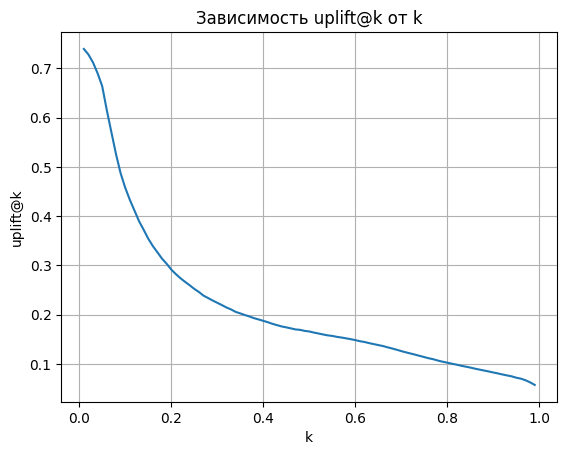

In [ ]:
values_uplift_k_two_m_trtmt = []
values_k = []
for k in np.arange(0.01,1,0.01):
  values_uplift_k_two_m_trtmt.append(uplift_at_k(y_val, uplift_tm_trtmt, treatment_val, strategy='overall', k=k))
  values_k.append(k)

plt.plot(values_k, values_uplift_k_two_m_trtmt)
plt.title('Зависимость uplift@k от k')
plt.xlabel('k')
plt.ylabel('uplift@k')
plt.grid()
plt.show()

In [ ]:
# weighted average uplift
uplift_full_data = weighted_average_uplift(y_val, uplift_tm_ctrl, treatment_val, bins=10)
print(f"average uplift на всей валидации: {uplift_full_data:.4f}")

average uplift на всей валидации: 0.0494


In [ ]:
#weighted average uplift
uplift_full_data = weighted_average_uplift(y_val, uplift_tm_trtmt, treatment_val, bins=10)
print(f"average uplift на всей валидации: {uplift_full_data:.4f}")

average uplift на всей валидации: 0.0497


In [ ]:
# Получим условные вероятности выполнения целевого действия при взаимодействии для каждого объекта
tm_trmnt_preds = two_models_ctrl.trmnt_preds_
# И условные вероятности выполнения целевого действия без взаимодействия для каждого объекта
tm_ctrl_preds = two_models_ctrl.ctrl_preds_

# Отрисуем распределения вероятностей и их разность (uplift)
#sklift.viz.plot_uplift_preds(trmnt_preds=tm_trmnt_preds, ctrl_preds=tm_ctrl_preds);

In [ ]:
# AUQC = area under Qini curve = Qini coefficient
auqc = qini_auc_score(y_val, uplift_tm_ctrl, treatment_val)
print(f"Qini coefficient на валидационной выборке: {auqc:.4f}")

Qini coefficient на валидационной выборке: 0.2397


In [ ]:
# AUQC = area under Qini curve = Qini coefficient
auqc = qini_auc_score(y_val, uplift_tm_trtmt, treatment_val)
print(f"Qini coefficient на валидационной выборке: {auqc:.4f}")

Qini coefficient на валидационной выборке: 0.2471


In [ ]:
# AUUC = area under Uplift curve
auuc = uplift_auc_score(y_val, uplift_tm_ctrl, treatment_val)
print(f"Uplift coefficient на валидационной выборке: {auuc:.4f}")

Uplift coefficient на валидационной выборке: 0.1660


In [ ]:
# AUUC = area under Uplift curve
auuc = uplift_auc_score(y_val, uplift_tm_trtmt, treatment_val)
print(f"Uplift coefficient на валидационной выборке: {auuc:.4f}")

Uplift coefficient на валидационной выборке: 0.1707


In [ ]:
# uplift_by_percentile
uplift_by_percentile(y_val, uplift_tm_ctrl, treatment_val,
                     strategy='overall',
                     total=False, std=True, bins=10)

,n_treatment,n_control,response_rate_treatment,response_rate_control,uplift,std_treatment,std_control,std_uplift
percentile,,,,,,,,
0-10,7413,7587,0.649265,0.197838,0.451426,0.005542,0.004574,0.007186
10-20,7423,7577,0.280345,0.167744,0.112600,0.005213,0.004292,0.006753
20-30,7510,7490,0.223435,0.140187,0.083249,0.004807,0.004012,0.006261
30-40,7521,7479,0.216195,0.128627,0.087568,0.004747,0.003871,0.006125
40-50,7652,7348,0.204652,0.130920,0.073732,0.004612,0.003935,0.006063
50-60,7533,7467,0.188902,0.142226,0.046676,0.004510,0.004042,0.006056
60-70,7507,7493,0.179433,0.147338,0.032095,0.004429,0.004095,0.006032
70-80,7480,7520,0.099465,0.150931,-0.051466,0.003460,0.004128,0.005387
80-90,7493,7507,0.081676,0.159984,-0.078308,0.003164,0.004231,0.005283


In [ ]:
# uplift_by_percentile
uplift_by_percentile(y_val, uplift_tm_trtmt, treatment_val,
                     strategy='overall',
                     total=False, std=True, bins=10)

,n_treatment,n_control,response_rate_treatment,response_rate_control,uplift,std_treatment,std_control,std_uplift
percentile,,,,,,,,
0-10,7433,7567,0.587112,0.129378,0.457734,0.005711,0.003858,0.006892
10-20,7471,7529,0.236113,0.109311,0.126802,0.004913,0.003596,0.006089
20-30,7499,7501,0.204027,0.113985,0.090042,0.004654,0.003669,0.005926
30-40,7587,7413,0.199684,0.120329,0.079355,0.004590,0.003779,0.005945
40-50,7532,7468,0.203664,0.123594,0.080070,0.004640,0.003808,0.006003
50-60,7546,7454,0.196263,0.135095,0.061168,0.004572,0.003959,0.006048
60-70,7436,7564,0.158419,0.166711,-0.008292,0.004234,0.004286,0.006025
70-80,7549,7451,0.090343,0.151523,-0.061180,0.003299,0.004154,0.005305
80-90,7548,7452,0.094727,0.170692,-0.075965,0.003371,0.004358,0.005510


In [ ]:
# Сравним построенные модели
pd.DataFrame(data=models_results).sort_values('uplift@30%', ascending=False)

,approach,uplift@30%
2,TwoModels,0.224499
4,TwoModels_ddr_treatment,0.223711
0,SoloModel,0.221885
3,TwoModels_ddr_control,0.213509
1,ClassTransformationModel,0.208586


## Две зависимые модели, перекрестная зависимость (X-learner)

In [ ]:
!pip install causalml

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.4/60.4 kB 2.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.6/6.6 MB 19.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 76.9/76.9 kB 5.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 50.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 522.0/522.0 kB 33.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 36.4/36.4 MB 20.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 11.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.8/56.8 kB 3.8 MB/s eta 0:00:00
  Attempting uninstall: scipy
    Found existing installation: scipy 1.13.1
    Uninstalling scipy-1.13.1:
      Successfully uninstalled scipy-1.13.1
  Attempting uninstall: Cython
    Found existing installation: Cython 3.0.11
    Uninstalling Cython-3.0.11:
      Successfully uninstalled Cython-3.0.11


In [ ]:
from causalml.inference.meta import BaseXRegressor
from causalml.inference.tree import UpliftTreeClassifier, UpliftRandomForestClassifier
from causalml.inference.tree import uplift_tree_string, uplift_tree_plot

Exception ignored on calling ctypes callback function: <function ThreadpoolController._find_libraries_with_dl_iterate_phdr.<locals>.match_library_callback at 0x7ab4ad220310>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/threadpoolctl.py", line 1005, in match_library_callback
    self._make_controller_from_path(filepath)
  File "/usr/local/lib/python3.10/dist-packages/threadpoolctl.py", line 1175, in _make_controller_from_path
    lib_controller = controller_class(
  File "/usr/local/lib/python3.10/dist-packages/threadpoolctl.py", line 114, in __init__
    self.dynlib = ctypes.CDLL(filepath, mode=_RTLD_NOLOAD)
  File "/usr/lib/python3.10/ctypes/__init__.py", line 374, in __init__
    self._handle = _dlopen(self._name, mode)
OSError: /usr/local/lib/python3.10/dist-packages/scipy.libs/libopenblasp-r0-01191904.3.27.so: cannot open shared object file: No such file or directory
ERROR:duecredit:Failed to import duecredit due to No module named 'duecredit'


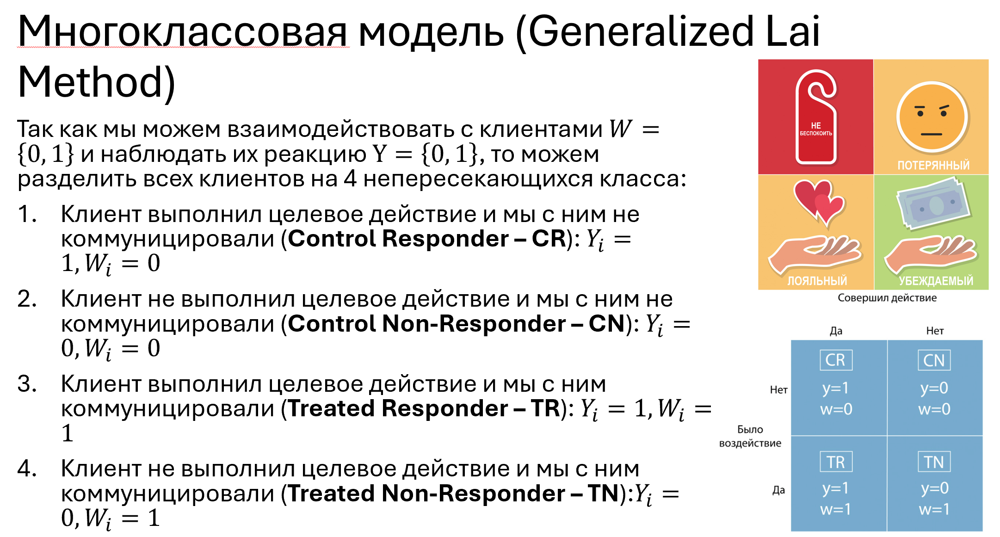

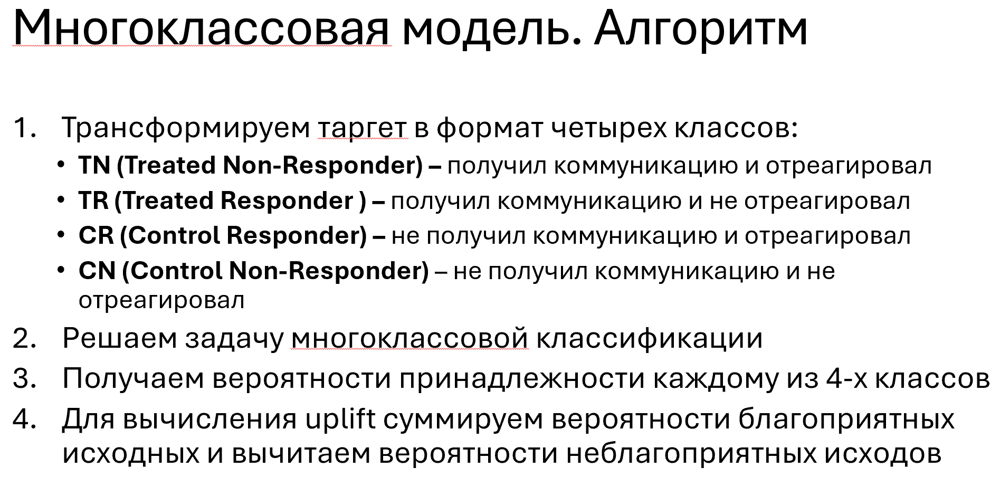

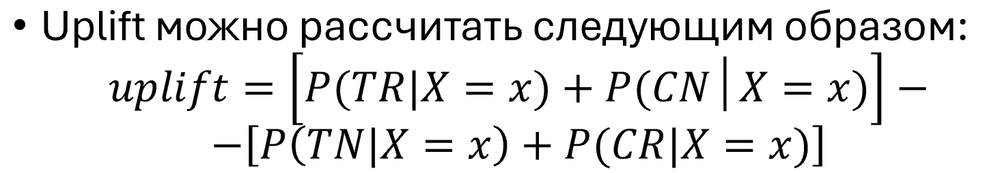

In [ ]:
a=[]
for i in range(len(df['target'])):
    if df['target'][i]==0 and df['treatment'][i]==0: #CN
        a.append(0)
    elif df['target'][i]==0 and df['treatment'][i]==1: #TN
        a.append(1)
    elif df['target'][i]==1 and df['treatment'][i]==1: #TR
        a.append(2)
    else:
        a.append(3) #CR
print(a)

[0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 2, 2, 3, 1, 1, 1, 0, 1, 3, 1, 3, 0, 0, 1, 1, 0, 1, 3, 1, 1, 3, 2, 0, 3, 0, 3, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 0, 1, 2, 0, 2, 0, 1, 1, 1, 3, 1, 1, 1, 0, 1, 1, 0, 0, 2, 2, 1, 3, 0, 0, 0, 1, 1, 0, 2, 1, 3, 1, 0, 2, 0, 2, 0, 1, 0, 3, 0, 0, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1, 3, 3, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 3, 3, 2, 0, 1, 0, 1, 0, 1, 1, 1, 3, 0, 3, 0, 2, 0, 1, 1, 1, 1, 3, 1, 0, 1, 3, 1, 0, 1, 3, 0, 0, 0, 1, 0, 0, 0, 1, 3, 1, 3, 1, 3, 0, 1, 1, 2, 0, 0, 0, 0, 1, 2, 0, 2, 1, 0, 3, 2, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 2, 1, 1, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 3, 1, 3, 1, 0, 0, 2, 0, 0, 1, 2, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 2, 0, 0, 1, 0, 0, 2, 0, 1, 0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 2, 1, 1, 2, 3, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 0, 0, 1, 1, 0, 2, 1, 0, 0, 1, 1, 

In [ ]:
df['target2'] = pd.DataFrame(a)

In [ ]:
#stratify_cols = pd.concat([df['treatment'], df['target']], axis=1)

X_train2, X_val2, y_train2, y_val2 = train_test_split(
    df['data'],
    df['target2'],
    stratify=df['target2'],
    test_size=0.25,
    random_state=seed
)
print(f"Размерность обучающего набора: {X_train2.shape}")
print(f"Размерность валидационной выборки: {X_val2.shape}")

print(f"Размерность валидационной выборки: {y_train2.shape}")
print(f"Размерность валидационной выборки: {y_val2.shape}")

Размерность обучающего набора: (450000, 50)
Размерность валидационной выборки: (150000, 50)
Размерность валидационной выборки: (450000, 1)
Размерность валидационной выборки: (150000, 1)


In [ ]:
from sklearn.model_selection import GridSearchCV

In [ ]:
from sklearn.metrics import f1_score, make_scorer
f1 = make_scorer(f1_score , average='macro')

In [ ]:
model = CatBoostClassifier(random_state=seed)
parameters = {
    'learning_rate': [0.05,0.1,0.15],
    'iterations': range(4, 7),
    'depth': range(4, 7)
}
gs = GridSearchCV(
    model,
    parameters,
    n_jobs=-1,
    cv=5,
    scoring = f1
)
gs.fit(X_train2, y_train2)
       # выведите лучшие гиперпараметры
print('Гиперпараметры', gs.best_params_)
# выведите лучшую метрику качества
print('ROC-AUC', gs.best_score_)


0:	learn: 1.3361961	total: 828ms	remaining: 3.31s
1:	learn: 1.3001484	total: 1.32s	remaining: 1.97s
2:	learn: 1.2728044	total: 1.82s	remaining: 1.21s
3:	learn: 1.2523319	total: 2.26s	remaining: 564ms
4:	learn: 1.2362362	total: 2.89s	remaining: 0us
Гиперпараметры {'depth': 5, 'iterations': 5, 'learning_rate': 0.15}
ROC-AUC 0.19325219318173864


In [ ]:
model = CatBoostClassifier(iterations=5, learning_rate=0.15, depth=5,)
model.fit(X_train2, y_train2)

0:	learn: 1.3364218	total: 1.35s	remaining: 5.42s
1:	learn: 1.2994200	total: 2.62s	remaining: 3.93s
2:	learn: 1.2720302	total: 3.24s	remaining: 2.16s
3:	learn: 1.2518503	total: 3.88s	remaining: 971ms
4:	learn: 1.2362440	total: 4.7s	remaining: 0us


In [ ]:
predict = model.predict(X_val2)

In [ ]:
predict_pro = model.predict_proba(X_val2)

In [ ]:
upliftt=[]
for i in range(len(predict_pro)):
  if predict[i]==0 or predict[i]==2:
    upliftt.append(predict_pro[i][0]+predict_pro[i][2]-predict_pro[i][1]-predict_pro[i][3])
upliftt

[0.0332964679653637,
 0.02447784699329611,
 0.02338651150047874,
 0.026327714118044798,
 0.04899251002367369,
 0.02352936307261308,
 0.020313213935978264,
 0.04504944298118316,
 0.010918364495697469,
 0.012493693464750183,
 0.024652514276644888,
 0.024690248507296286,
 0.03041163968413499,
 0.01576972290928408,
 0.03422013950182434,
 0.030135182962315793,
 0.04406677405227841,
 0.023206338485711187,
 0.032456148010850394,
 0.024031172880386864,
 0.036849722493196985,
 0.02877834410776564,
 0.024894157247736165,
 0.01855482058489888,
 0.0398466171314846,
 0.016168531866314922,
 0.04173411379642669,
 0.018936586282134155,
 0.036061836237752054,
 0.041602984714581015,
 0.03214082094808404,
 0.03246542820082968,
 0.013539198845555683,
 0.0284982037645585,
 0.021229164870912864,
 0.019852010144263577,
 0.04492876626936346,
 0.027631946392842277,
 0.029182554706092878,
 0.013341055563347914,
 0.022935510070204196,
 0.030104351082681807,
 0.01809025705723133,
 0.025598712799295376,
 0.0285936

In [ ]:
sorted(upliftt,reverse=True)

[0.08349375269628703,
 0.07697522672061813,
 0.07691459125715863,
 0.07071219353352401,
 0.06914249728867591,
 0.06299066691297686,
 0.06242821461432024,
 0.060968146279590324,
 0.06081672521732548,
 0.06016127317452438,
 0.05985288574637965,
 0.05985288574637965,
 0.059752848361202704,
 0.05953910197799164,
 0.05929207558387628,
 0.05894871912519836,
 0.05850280841221109,
 0.05850280841221109,
 0.05850280841221109,
 0.05835248586597527,
 0.058344409132084024,
 0.058188361972339536,
 0.058188361972339536,
 0.058188361972339536,
 0.058188361972339536,
 0.058188361972339536,
 0.058188361972339536,
 0.058188361972339536,
 0.057740130236026144,
 0.057740130236026144,
 0.057740130236026144,
 0.05742479038017312,
 0.05742479038017312,
 0.05742479038017312,
 0.05716732218705234,
 0.05716732218705234,
 0.057162622890795434,
 0.05694623907511359,
 0.056888685051595084,
 0.056888685051595084,
 0.056888685051595084,
 0.056888685051595084,
 0.056888685051595084,
 0.056888685051595084,
 0.056847073

In [ ]:
mc_score_by_group = uplift_at_k(y_true=y_val, uplift=upliftt, treatment=treatment_val, strategy='by_group', k=0.3)
mc_score_overall = uplift_at_k(y_true=y_val, uplift=upliftt, treatment=treatment_val, strategy='overall', k=0.3)
print(f'uplift@30% by group {mc_score_by_group}')
print(f'uplift@30% overall {mc_score_overall}')
#models_results['approach'].append('Multi-class model')
#odels_results['uplift@30%'].append(mc_score_by_group)


ValueError: Found input variables with inconsistent numbers of samples: [150000, 139240, 150000]

In [ ]:
# weighted average uplift
uplift_full_data = weighted_average_uplift(y_val, upliftt, treatment_val, bins=10)
print(f"average uplift на всей валидации: {uplift_full_data:.4f}")

In [ ]:
# AUQC = area under Qini curve = Qini coefficient
auqc = qini_auc_score(y_val, upliftt, treatment_val)
print(f"Qini coefficient на валидационной выборке: {auqc:.4f}")

In [ ]:
 #AUUC = area under Uplift curve
auuc = uplift_auc_score(y_val, upliftt, treatment_val)
print(f"Uplift coefficient на валидационной выборке: {auuc:.4f}")

In [ ]:
# uplift_by_percentile
uplift_by_percentile(y_val, upliftt, treatment_val,
                     strategy='overall',
                     total=False, std=True, bins=10)

# X-learner

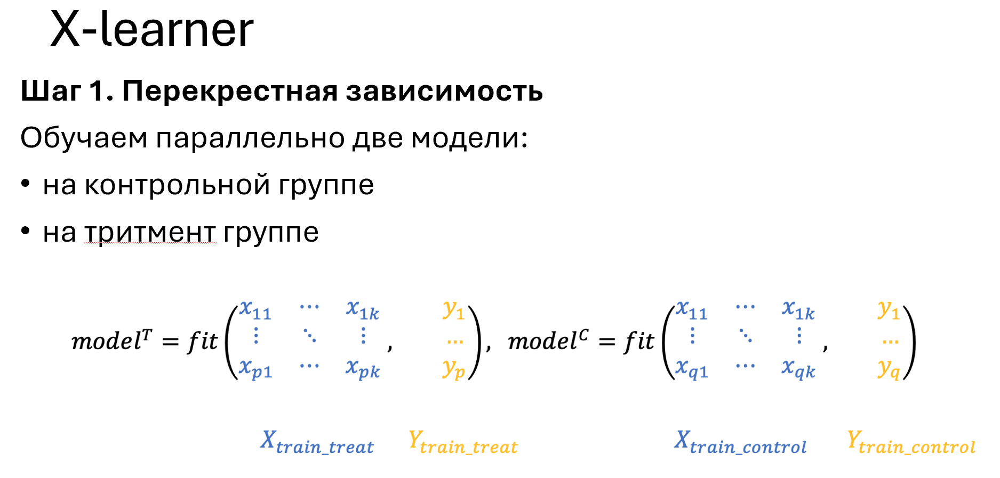

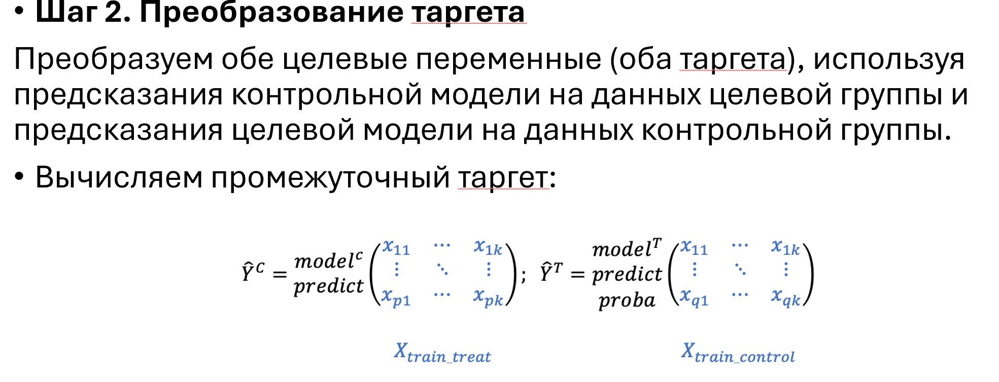

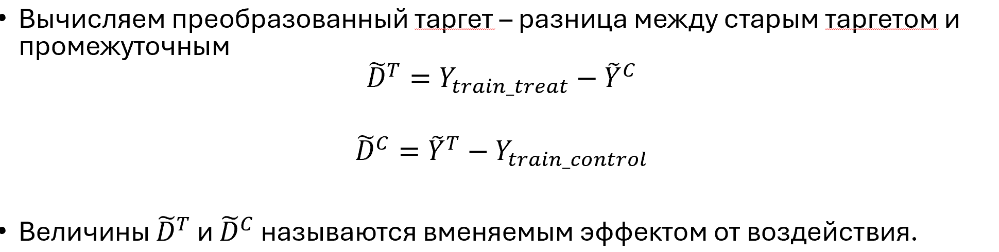

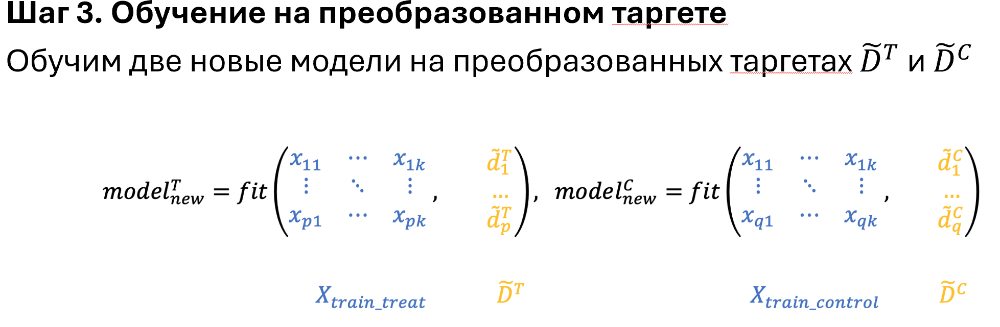

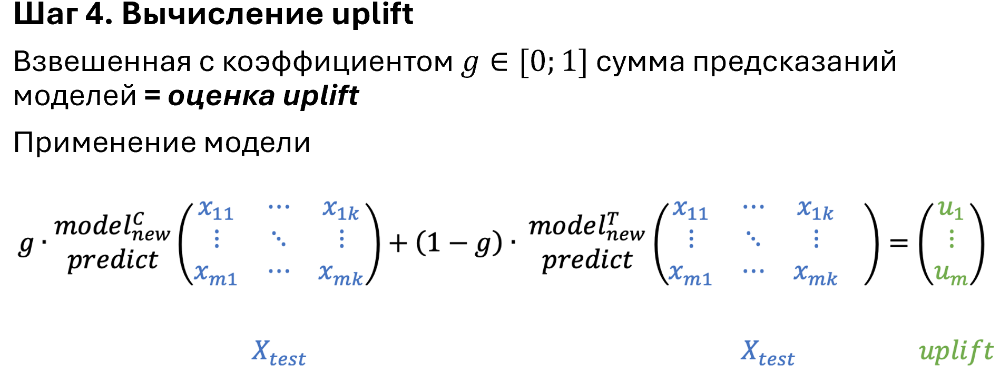

In [ ]:
treatment_train

In [ ]:
# инициализация и обучение X-Learner
x_learner = BaseXRegressor(learner=lgb.LGBMRegressor(max_depth=4, learning_rate=0.1, n_estimators=100))
x_learner.fit(X=X_train, treatment=treatment_train, y=y_train)
# оценка CATE
cate_estimates = x_learner.predict(X_val)


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.125801 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 12750
[LightGBM] [Info] Number of data points in the train set: 224724, number of used features: 50
[LightGBM] [Info] Start training from score 0.179402
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

In [ ]:
cate_estimates

array([[ 0.04281478],
       [-0.07842167],
       [ 0.08537293],
       ...,
       [ 0.0607253 ],
       [ 0.01652014],
       [-0.12916057]])

In [ ]:
cate_estimates2=[]
for i in range(len(cate_estimates)):
  cate_estimates2.append(cate_estimates[i][0])
cate_estimates2

[0.042814783893932506,
 -0.07842167214216815,
 0.08537293120406808,
 0.07591193635308456,
 -0.1091775939714685,
 0.016141606767122917,
 0.03304498421116127,
 0.029877231179221666,
 0.08548591934286556,
 -0.027708228635268072,
 -0.3433501843468417,
 0.0931440792406479,
 0.06856760720635188,
 0.05299416655910604,
 -0.11510745277851728,
 0.05481029436541777,
 0.1577610533187075,
 0.05790776717148725,
 0.09071765968129203,
 0.5570561514898197,
 0.12941510354151403,
 0.08669842486734529,
 0.052202092285104626,
 0.04547851439675944,
 0.07713047040234902,
 0.2941528500672096,
 -0.025045981380559582,
 -0.20512848744359496,
 -0.0914448502304656,
 -0.021220395437078574,
 0.10077970577426336,
 -0.19303705295945253,
 -0.15529219013912024,
 0.0750237973838607,
 -0.10533705831251547,
 0.11086979302646018,
 0.10315816423817524,
 0.08263856769890723,
 -0.1710982535444542,
 -0.1348212855054503,
 0.10191075963525638,
 0.04349907451996063,
 -0.01242886904684545,
 0.31216898892518885,
 -0.1431768881654913

In [ ]:
tm_score_by_group = uplift_at_k(y_true=y_val, uplift=cate_estimates2, treatment=treatment_val, strategy='by_group', k=0.3)
tm_score_overall = uplift_at_k(y_true=y_val, uplift=cate_estimates2, treatment=treatment_val, strategy='overall', k=0.3)
print(f'uplift@30% by group {tm_score_by_group}')
print(f'uplift@30% overall {tm_score_overall}')
models_results['approach'].append('X-Learner')
models_results['uplift@30%'].append(tm_score_by_group)

uplift@30% by group 0.19953649268281254
uplift@30% overall 0.19951341287922297


In [ ]:
# weighted average uplift
uplift_full_data = weighted_average_uplift(y_val, cate_estimates2, treatment_val, bins=10)
print(f"average uplift на всей валидации: {uplift_full_data:.4f}")

average uplift на всей валидации: 0.0495


In [ ]:
# Получим условные вероятности выполнения целевого действия при взаимодействии для каждого объекта
#tm_trmnt_preds = x_learner.trmnt_preds_

In [ ]:
# AUQC = area under Qini curve = Qini coefficient
auqc = qini_auc_score(y_val, cate_estimates2, treatment_val)
print(f"Qini coefficient на валидационной выборке: {auqc:.4f}")

Qini coefficient на валидационной выборке: 0.2139


In [ ]:
# AUUC = area under Uplift curve
auuc = uplift_auc_score(y_val, cate_estimates2, treatment_val)
print(f"Uplift coefficient на валидационной выборке: {auuc:.4f}")

Uplift coefficient на валидационной выборке: 0.1476


In [ ]:
# uplift_by_percentile
uplift_by_percentile(y_val, cate_estimates2, treatment_val,
                     strategy='overall',
                     total=False, std=True, bins=10)

,n_treatment,n_control,response_rate_treatment,response_rate_control,uplift,std_treatment,std_control,std_uplift
percentile,,,,,,,,
0-10,7516,7484,0.494545,0.136024,0.358521,0.005767,0.003963,0.006997
10-20,7455,7545,0.254326,0.123791,0.130535,0.005044,0.003792,0.006310
20-30,7496,7504,0.233725,0.125133,0.108591,0.004888,0.003820,0.006203
30-40,7463,7537,0.218679,0.130158,0.088521,0.004785,0.003876,0.006158
40-50,7584,7416,0.212421,0.126348,0.086072,0.004697,0.003858,0.006078
50-60,7506,7494,0.201439,0.141713,0.059725,0.004629,0.004029,0.006137
60-70,7534,7466,0.183833,0.173855,0.009978,0.004463,0.004386,0.006257
70-80,7533,7467,0.185185,0.232891,-0.047706,0.004476,0.004891,0.006630
80-90,7454,7546,0.171452,0.293533,-0.122081,0.004366,0.005242,0.006822


## Decision trees for uplift modeling

In [ ]:
treatment_train.replace([1, 0], ['treatment', 'control'], inplace = True)
#treatment_val.replace([1, 0], ['treatment', 'control'], inplace = True)

In [ ]:
X_train4 = pd.concat([X_train,treatment_train], axis = 1)
X_train4

,X_1,X_2,X_3,X_4,X_5,X_6,X_7,X_8,X_9,X_10,X_11,X_12,X_13,X_14,X_15,X_16,X_17,X_18,X_19,X_20,X_21,X_22,X_23,X_24,X_25,X_26,X_27,X_28,X_29,X_30,X_31,X_32,X_33,X_34,X_35,X_36,X_37,X_38,X_39,X_40,X_41,X_42,X_43,X_44,X_45,X_46,X_47,X_48,X_49,X_50,treatment_group
92851,-34.698436,-0.619711,-24.348021,-27.440082,-30.933153,118.686386,0.875191,29.520952,-14.829699,97.915884,-664.502535,5.540260,-91.374746,-50.209799,73.465060,46.292149,-147.363250,12.393390,14.738699,39.344566,61.742003,6.993936,0.758859,-0.491927,46.443386,-22.323954,8.968248,117.414413,-84.511341,0.369228,-32.965139,114.136654,-187.064880,-1.868386,45.757364,41.785682,0.497651,-76.352039,-162.883886,60.965301,29.820044,-63.941348,215.841083,-1.557703,16.354415,1.260376,711.502775,48.091531,45.511164,24.602535,treatment
483960,-82.760764,-0.254797,-31.980126,18.351109,106.213526,297.766197,125.231602,19.371026,-39.226825,54.453300,-620.002519,3.081068,-9.610040,-37.980285,-156.414104,49.114206,-183.533772,8.243193,-1.625314,58.801151,-207.155667,345.822550,1.455832,-1.499032,-155.826019,-20.095821,10.698376,19.354472,-79.754974,0.353583,-28.771683,85.277841,11.889021,10.044837,11.658407,105.024880,186.065129,-84.151655,-38.858905,34.576685,83.011154,90.777845,35.579024,-0.109922,27.186106,0.215644,676.908017,93.984562,-81.616728,33.978005,treatment
459714,-14.382155,0.524543,-29.917801,49.039901,21.659706,-34.346415,-20.936283,77.181327,47.487860,192.180490,70.326674,10.873924,26.158740,-81.310419,67.871085,64.873382,366.732463,-0.189473,24.601823,18.211236,63.759944,67.916376,-0.059635,0.028375,47.961316,31.834740,-19.567225,-289.684132,-135.949603,0.636531,-84.239193,124.812644,-221.859717,4.274531,53.308338,1.364835,64.215621,-190.335651,121.457244,41.732871,-50.128127,104.623094,-532.521821,0.317084,41.967335,2.065914,-99.758337,274.226107,-71.049340,-23.596125,treatment
209537,58.206732,-0.291427,24.855666,3.428205,10.124705,-58.051742,-47.468304,19.474772,7.757691,-89.334499,862.779658,-5.054710,-22.253120,-32.063753,-24.601675,3.309743,345.862120,-9.024910,18.666135,8.229931,-30.895947,-39.355529,1.071686,0.228502,-23.240457,-31.887368,2.762525,-159.119322,-42.502223,0.235193,11.206084,4.200491,76.878542,-2.520353,32.605267,-110.892744,7.862137,106.771197,59.512092,1.776031,29.094812,16.132499,-292.506567,0.201792,62.543594,1.654411,-962.504576,-46.454571,-14.366664,-54.984202,treatment
119998,-23.608443,-0.173582,25.074391,-4.452643,48.247146,25.747172,14.506435,94.354281,-60.854547,74.725270,-364.748327,4.228093,56.731857,25.513071,73.680746,129.321068,-66.164049,-5.332089,0.809977,-68.173483,72.277912,169.186820,-0.317502,-0.256379,54.368676,8.556459,-23.096517,37.469757,53.225822,-0.834908,-51.760934,70.590067,-41.555214,-5.471223,-39.806598,74.711032,28.002626,11.570675,-151.371447,38.660179,170.738650,-97.790861,68.880069,-1.700635,-90.944385,1.045141,417.852631,32.004772,100.561265,21.044276,treatment
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
108676,-11.532382,0.530807,-14.935495,4.543880,84.737273,30.840439,-14.723415,51.810837,-52.303878,-54.205207,263.632512,-3.067030,82.411255,-59.252758,43.174346,44.686558,204.296355,4.566181,42.622018,12.980306,56.534129,212.424086,-0.905075,-0.911307,42.525934,1.718174,14.452906,-319.018970,-68.472105,-2.210778,-23.747506,61.718005,131.044394,-10.882065,-40.466327,8.557586,301.215114,28.646469,46.295813,-8.140891,-347.486753,244.927589,-586.447597,1.426963,17.191579,-0.815931,-272.894834,59.371211,-257.319630,-3.880402,treatment
237898,-70.216007,-0.712030,18.186430,13.632816,-10.955192,59.664289,4.148115,-78.174702,50.710324,-34.422072,-499.759739,-1.947664,69.743240,-26.365196,97.441363,17.989436,-43.427159,-3.719603,-16.441103,43.077254,124.374323,11.970727,-0.210892,0.720746,93.556483,15.832199,-2.730041,60.995030,-74.337919,1.137467,7.876221,-59

In [ ]:
# Train uplift tree
uplift_model_tree = UpliftTreeClassifier(max_depth = 8, min_samples_leaf = 200, min_samples_treatment = 50, n_reg = 100, evaluationFunction='ED', control_name='control')

uplift_model_tree.fit(X_train,
                 treatment=treatment_train,
                 y=y_train)


In [ ]:
# Print uplift tree as a string
result = uplift_tree_string(uplift_model_tree.fitted_uplift_tree, X_train.columns)

X_16treatment_group_key >= -118.04109172271485?
yes -> X_16treatment_group_key >= 134.83178250564674?
		yes -> X_29treatment_group_key >= -94.20292357441186?
				yes -> X_4treatment_group_key >= 94.51881083710272?
						yes -> X_8treatment_group_key >= -4.783976017463035?
								yes -> [0.14965986394557823, 0.352112676056338]
								no  -> [0.14814814814814814, 0.21428571428571427]
						no  -> X_3treatment_group_key >= -40.12258956074992?
								yes -> X_41treatment_group_key >= -159.1478694638568?
										yes -> X_6treatment_group_key >= 179.59989985964015?
												yes -> [0.12266666666666666, 0.05249343832020997]
												no  -> [0.18044117647058824, 0.047787090133803854]
										no  -> X_19treatment_group_key >= -25.03357568552023?
												yes -> [0.332824427480916, 0.08127721335268505]
												no  -> [0.13043478260869565, 0.07428571428571429]
								no  -> X_7treatment_group_key >= 24.238023755906184?
										yes -> [0.075, 0.05]
										no  -> X_45treat

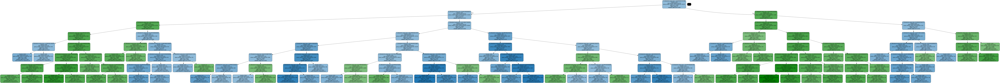

In [ ]:
# Plot uplift tree
from IPython.display import Image

graph = uplift_tree_plot(uplift_model_tree.fitted_uplift_tree,X_train.columns)
Image(graph.create_png())

In [ ]:
uplift_model_tree.predict(X_val)

array([[0.18023384, 0.22049998],
       [0.18023384, 0.22049998],
       [0.18023384, 0.22049998],
       ...,
       [0.18023384, 0.22049998],
       [0.18023384, 0.22049998],
       [0.06360424, 0.02953586]])

In [ ]:
uplift_tree= uplift_model_tree.predict(X_val)

In [ ]:
uplift_tree[0][1]

In [ ]:
uplift_tree2=[] #или вычесть
for i in range(len(uplift_tree)):
  uplift_tree2.append(uplift_tree[i][1]-uplift_tree[i][0])
uplift_tree2

[0.040266140371825715,
 0.040266140371825715,
 0.040266140371825715,
 0.040266140371825715,
 0.040266140371825715,
 0.040266140371825715,
 0.013249920832702294,
 0.040266140371825715,
 0.12307913760648917,
 0.040266140371825715,
 0.040266140371825715,
 0.040266140371825715,
 0.040266140371825715,
 0.040266140371825715,
 -0.13265408633678438,
 0.040266140371825715,
 0.11090215498739814,
 0.040266140371825715,
 0.040266140371825715,
 0.47680966997986096,
 0.040266140371825715,
 0.040266140371825715,
 0.040266140371825715,
 0.040266140371825715,
 0.013249920832702294,
 0.040266140371825715,
 0.040266140371825715,
 -0.42732934325461014,
 0.040266140371825715,
 0.040266140371825715,
 0.040266140371825715,
 -0.1413786841737043,
 0.05639667555651909,
 0.040266140371825715,
 -0.25154721412823094,
 0.0423765700783485,
 0.040266140371825715,
 0.040266140371825715,
 0.040266140371825715,
 0.040266140371825715,
 0.040266140371825715,
 0.040266140371825715,
 0.040266140371825715,
 0.040266140371825

In [ ]:
tree_score_by_group = uplift_at_k(y_true=y_val, uplift=uplift_tree2, treatment=treatment_val, strategy='by_group', k=0.3)
tree_score_overall = uplift_at_k(y_true=y_val, uplift=uplift_tree2, treatment=treatment_val, strategy='overall', k=0.3)
print(f'uplift@30% by group {tree_score_by_group}')
print(f'uplift@30% overall {tree_score_overall}')
models_results['approach'].append('UpliftTreeClassifier')
models_results['uplift@30%'].append(tree_score_by_group)

uplift@30% by group 0.12616926062681508
uplift@30% overall 0.12578874972117754


In [ ]:
# weighted average uplift
uplift_full_data = weighted_average_uplift(y_val, uplift_tree2, treatment_val, bins=10)
print(f"average uplift на всей валидации: {uplift_full_data:.4f}")

average uplift на всей валидации: 0.0495


In [ ]:
# AUQC = area under Qini curve = Qini coefficient
auqc = qini_auc_score(y_val, uplift_tree2, treatment_val)
print(f"Qini coefficient на валидационной выборке: {auqc:.4f}")

Qini coefficient на валидационной выборке: 0.1022


In [ ]:
# AUUC = area under Uplift curve
auuc = uplift_auc_score(y_val, uplift_tree2, treatment_val)
print(f"Uplift coefficient на валидационной выборке: {auuc:.4f}")

Uplift coefficient на валидационной выборке: 0.0703


In [ ]:
# uplift_by_percentile
uplift_by_percentile(y_val, uplift_tree2, treatment_val,
                     strategy='overall',
                     total=False, std=True, bins=10)

,n_treatment,n_control,response_rate_treatment,response_rate_control,uplift,std_treatment,std_control,std_uplift
percentile,,,,,,,,
0-10,7596,7404,0.406135,0.171394,0.234741,0.005635,0.004380,0.007137
10-20,7463,7537,0.290098,0.182566,0.107532,0.005253,0.004450,0.006884
20-30,7538,7462,0.214513,0.180247,0.034267,0.004728,0.004450,0.006493
30-40,7447,7553,0.212166,0.173044,0.039122,0.004738,0.004353,0.006434
40-50,7424,7576,0.220501,0.177270,0.043231,0.004812,0.004388,0.006512
50-60,7474,7526,0.214075,0.183099,0.030977,0.004745,0.004458,0.006510
60-70,7495,7505,0.222815,0.181346,0.041469,0.004807,0.004448,0.006549
70-80,7498,7502,0.218325,0.184484,0.033841,0.004771,0.004478,0.006543
80-90,7566,7434,0.214644,0.178639,0.036006,0.004720,0.004443,0.006482


# UpliftRandomForestClassifier

In [ ]:
# Train uplift tree
uplift_model_RandomForest = UpliftRandomForestClassifier(max_depth = 4,n_estimators=50, min_samples_leaf = 200, min_samples_treatment = 50, n_reg = 100, evaluationFunction='KL', control_name='control')

uplift_model_RandomForest.fit(X_train.values,
                 treatment=treatment_train.values,
                 y=y_train.values)

In [ ]:
uplift_RandomForest= uplift_model_RandomForest.predict(X_val)

In [ ]:
uplift_RandomForest

In [ ]:
uplift_RandomForest2=[]
for i in range(len(uplift_RandomForest)):
  uplift_RandomForest2.append(uplift_RandomForest[i][0])
uplift_RandomForest2

[0.05434306381315937,
 0.046045009818461824,
 0.048629613206610856,
 0.04769994701783348,
 0.046045009818461824,
 0.054652271082088366,
 0.06806902452987285,
 0.07377443705080564,
 0.05767299726679534,
 0.044392702680358415,
 0.045367079418491135,
 0.046045009818461824,
 0.046045009818461824,
 0.04769994701783348,
 0.02846346621269888,
 0.046045009818461824,
 0.05838544897706324,
 0.07569295200858467,
 0.047561324600011445,
 0.15288799312924406,
 0.06841847414564081,
 0.05074281655861404,
 0.046045009818461824,
 0.05002461041111317,
 0.04676128297563609,
 0.06668667528523323,
 0.048121013598142665,
 -0.04607984897829054,
 0.04719279633924259,
 0.04719279633924259,
 0.046045009818461824,
 -0.04795676946366487,
 0.06110081476770715,
 0.04719279633924259,
 0.023891379632157483,
 0.03652053106632622,
 0.04696444395133073,
 0.05473393181818903,
 0.046045009818461824,
 0.04313522533228617,
 0.049866115366306696,
 0.045178578741798675,
 0.051505317478597434,
 0.04696444395133073,
 0.061892068

In [ ]:
tree_score_by_group = uplift_at_k(y_true=y_val, uplift=uplift_RandomForest2, treatment=treatment_val, strategy='by_group', k=0.3)
tree_score_overall = uplift_at_k(y_true=y_val, uplift=uplift_RandomForest2, treatment=treatment_val, strategy='overall', k=0.3)
print(f'uplift@30% by group {tree_score_by_group}')
print(f'uplift@30% overall {tree_score_overall}')
models_results['approach'].append('UpliftRandomForestClassifier')
models_results['uplift@30%'].append(tree_score_by_group)

uplift@30% by group 0.13959527788203935
uplift@30% overall 0.13950251988524737


In [ ]:
# weighted average uplift
uplift_full_data = weighted_average_uplift(y_val, uplift_RandomForest2, treatment_val, bins=10)
print(f"average uplift на всей валидации: {uplift_full_data:.4f}")

average uplift на всей валидации: 0.0493


In [ ]:
# AUQC = area under Qini curve = Qini coefficient
auqc = qini_auc_score(y_val, uplift_RandomForest2, treatment_val)
print(f"Qini coefficient на валидационной выборке: {auqc:.4f}")

Qini coefficient на валидационной выборке: 0.1256


In [ ]:
# AUUC = area under Uplift curve
auuc = uplift_auc_score(y_val, uplift_RandomForest2, treatment_val)
print(f"Uplift coefficient на валидационной выборке: {auuc:.4f}")

Uplift coefficient на валидационной выборке: 0.0864


In [ ]:
# uplift_by_percentile
uplift_by_percentile(y_val, uplift_RandomForest2, treatment_val,
                     strategy='overall',
                     total=False, std=True, bins=10)

,n_treatment,n_control,response_rate_treatment,response_rate_control,uplift,std_treatment,std_control,std_uplift
percentile,,,,,,,,
0-10,7612,7388,0.382554,0.165674,0.216880,0.005571,0.004325,0.007053
10-20,7481,7519,0.282048,0.168240,0.113807,0.005203,0.004314,0.006759
20-30,7539,7461,0.261838,0.174910,0.086929,0.005063,0.004398,0.006707
30-40,7390,7610,0.233965,0.157424,0.076540,0.004925,0.004175,0.006456
40-50,7469,7531,0.210336,0.161068,0.049268,0.004716,0.004236,0.006339
50-60,7469,7531,0.207391,0.160935,0.046456,0.004691,0.004234,0.006320
60-70,7464,7536,0.193060,0.161093,0.031967,0.004569,0.004235,0.006229
70-80,7517,7483,0.207796,0.192971,0.014825,0.004680,0.004562,0.006535
80-90,7597,7403,0.198236,0.227746,-0.029509,0.004574,0.004874,0.006684


In [ ]:
df1 = pd.DataFrame(models_results)
df1

,approach,uplift@30%
0,SoloModel,0.221885
1,ClassTransformationModel,0.208586
2,TwoModels,0.224499
3,TwoModels_ddr_control,0.213509
4,TwoModels_ddr_treatment,0.223711
5,X-Learner,0.199536
6,UpliftTreeClassifier,0.126169
7,UpliftRandomForestClassifier,0.139595
